# Bank Direct Marketing: Term Deposit Subscription Forecast

Author: Yiqun Su, yiquns3@uci.edu

Course Project, UC Irvine, Math 10, F23

## - Introduction -

This project involves analyzing data from a Portuguese banking institution's direct marketing campaigns, obtained from the UCI Machine Learning Repository. The main objective is to predict whether clients will subscribe to a term deposit based on clients' personal features and bank's interactions, aiming to reveal key patterns that impact subscription decisions. Ultimately, this analysis aims to offer valuable insights to enhance the institution's marketing strategies in the banking sector.

## - Main Section -
Now we are going to start our project!

### Part I. Download and Clean the Database
- Before diving into analysis, the initial step involves downloading our data, typically stored as a CSV file, using the **pd.read_csv()** method in Python. In this project, we will name the dataframe **df**.
- Once we've acquired the data, the next crucial step is to check whether exists Nan in side our data frame. We can check the database with the **isna().any()** method. If there is any column contain **NaN**, then we can clean it using methods like **dropna()** to remove empty or irrelevant entries. Otherwise, we can keep going since the data is clean. This cleaning process ensures accuracy, consistency, and completeness, setting the stage for reliable analysis and insights.

In [ ]:
import pandas as pd
df = pd.read_csv('bank-full.csv')
df.head(5)

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no


In [ ]:
df.isna().any()

age          False
job          False
marital      False
education    False
default      False
balance      False
housing      False
loan         False
contact      False
day          False
month        False
duration     False
campaign     False
pdays        False
previous     False
poutcome     False
y            False
dtype: bool

In our case, since all columns are False, the data doesn't contain missing values.
Also, from the above output, we can see each column's name. 
We can also check each column's name and data type with the method **df.dtypes**

In [ ]:
df.dtypes

age           int64
job          object
marital      object
education    object
default      object
balance       int64
housing      object
loan         object
contact      object
day           int64
month        object
duration      int64
campaign      int64
pdays         int64
previous      int64
poutcome     object
y            object
dtype: object

In case you don't know the meaning of each variables, I will provide the explanations below.

**variables:**
- bank client data:
   1 - age (numeric)
   2 - job : type of job (categorical: "admin.","unknown","unemployed","management","housemaid","entrepreneur","student",
                                       "blue-collar","self-employed","retired","technician","services") 
   3 - marital : marital status (categorical: "married","divorced","single"; note: "divorced" means divorced or widowed)
   4 - education (categorical: "unknown","secondary","primary","tertiary")
   5 - default: has credit in default? (binary: "yes","no")
   6 - balance: average yearly balance, in euros (numeric) 
   7 - housing: has housing loan? (binary: "yes","no")
   8 - loan: has personal loan? (binary: "yes","no")
- related with the last contact of the current campaign:
   9 - contact: contact communication type (categorical: "unknown","telephone","cellular") 
  10 - day: last contact day of the month (numeric)
  11 - month: last contact month of year (categorical: "jan", "feb", "mar", ..., "nov", "dec")
  12 - duration: last contact duration, in seconds (numeric)
- other attributes:
  13 - campaign: number of contacts performed during this campaign and for this client (numeric, includes last contact)
  14 - pdays: number of days that passed by after the client was last contacted from a previous campaign (numeric, -1 means client was not previously contacted)
  15 - previous: number of contacts performed before this campaign and for this client (numeric)
  16 - poutcome: outcome of the previous marketing campaign (categorical: "unknown","other","failure","success")
- desired target:
  17 - y - has the client subscribed a term deposit? (binary: "yes","no")

From the data information shown above, we can see some of the columns have wrong data type. 
- For example, **day** and **month** are int64 and object, but usually we want to put them together and generate a **datetime** data type. However, since we are not going to consider that as a variable in the following analysis, we can remove those two columns with the method **drop(columns = ['column name'], inplace = True)**
- In addition, we can see the column **['default', 'housing', 'loan', 'y']** all have the data type **object**, but we want to convert them to **boolean value** with the following method (has reference).

In [ ]:
df.drop(columns = ['day','month'],inplace = True)
df[['default','housing','loan','y']] =  df[['default','housing','loan','y']].replace({'yes': True, 'no': False}).astype(bool)
df.head(5)

,age,job,marital,education,default,balance,housing,loan,contact,duration,campaign,pdays,previous,poutcome,y
0,58,management,married,tertiary,False,2143,True,False,unknown,261,1,-1,0,unknown,False
1,44,technician,single,secondary,False,29,True,False,unknown,151,1,-1,0,unknown,False
2,33,entrepreneur,married,secondary,False,2,True,True,unknown,76,1,-1,0,unknown,False
3,47,blue-collar,married,unknown,False,1506,True,False,unknown,92,1,-1,0,unknown,False
4,33,unknown,single,unknown,False,1,False,False,unknown,198,1,-1,0,unknown,False


Let's take an overview of our data frame again. 
You can see that there exists string called **'unknown'** in many object columns.
- Remark: Even though we use the method **isna()** to check if there exists any the missing value, there still might exists some elements represent the similar meaning as **NaN**, such as **'unknown'** in our case.
To better clean up our data, we can check the amount of **'unknown'** values in each column and decide whether to keep or erase those values.
- to get the columns might include that string: we use **df.select_dtypes(include=object).columns**
- to check the amount of **'unknown'** values in each column: we use **for loop** and **df.value_counts('column name')**

In [ ]:
for i in list(df.select_dtypes(include=object).columns): #reference
    print(df.value_counts(i))

job
blue-collar      9732
management       9458
technician       7597
admin.           5171
services         4154
retired          2264
self-employed    1579
entrepreneur     1487
unemployed       1303
housemaid        1240
student           938
unknown           288
dtype: int64
marital
married     27214
single      12790
divorced     5207
dtype: int64
education
secondary    23202
tertiary     13301
primary       6851
unknown       1857
dtype: int64
contact
cellular     29285
unknown      13020
telephone     2906
dtype: int64
poutcome
unknown    36959
failure     4901
other       1840
success     1511
dtype: int64


Now, we can see the string **'unknown'**:
- take a **small propotion** in column **'job'**
- **doesn't exist** in column **'marital'**
- take a **relative small** propotion in column **'education'**
- take a **large** propotion in column **'contact'**
- take a **extreme large** propotion in column **'poutcome'**
Base on our observation, we can remove the columns **'contact'** and **'poutcome'** since they have too much unknown values which won't be helpful in the later analysis; for columns **'job'** and **'education'**, we can erase the corresponding rows which contain **'unknown'**, in order to ensure a better performance in later regression.
- To remove the columns, we will use the same method as before: **drop(column = , inplace = True)** 
- To remove the rows exist **'unknown'**, we will utilize **Boolean values** to help us get the result

In [ ]:
df.drop(columns = ['contact', 'poutcome'],inplace = True)
df = df[~((df['job']=='unknown') | (df['education']=='unknown'))]

In [ ]:
df.head(5)

,age,job,marital,education,default,balance,housing,loan,duration,campaign,pdays,previous,y
0,58,management,married,tertiary,False,2143,True,False,261,1,-1,0,False
1,44,technician,single,secondary,False,29,True,False,151,1,-1,0,False
2,33,entrepreneur,married,secondary,False,2,True,True,76,1,-1,0,False
5,35,management,married,tertiary,False,231,True,False,139,1,-1,0,False
6,28,management,single,tertiary,False,447,True,True,217,1,-1,0,False


Finally, we obtain an useful data frame! Let's move to the next stage.

### Part II. Client Feature Comparation: Dummy Variable and Logistic Regression
In this section, we'll use Logistic Regression, a method from unsupervised learning, to analyze client data and see how different clients features affect whether a client subscribes to a term deposit. We'll also use dummy variables. Here are some explanations:
- **Supervised learning**: It's a machine learning approach where algorithms learn patterns from labeled data.
- **Logistic Regression**: It's a statistical method used to model the relationship between a categorical outcome (subscription to a term deposit: "yes" or "no") and independent variables.
- **Dummy variable**: It's a numeric representation of categorical data. For example, our 'job' column contains different job categories as strings. To use this categorical data in Logistic Regression, we convert it into dummy variables (binary values 0 or 1) to help the model understand these categories.

$$
y = β_0 + β_1 \cdot \text{age} + β_2 \cdot \text{job} + β_3 \cdot \text{marital} + β_4 \cdot \text{education} + β_5 \cdot \text{default} + β_6 \cdot \text{balance} + β_7 \cdot \text{housing} + β_8 \cdot \text{loan}
$$

This formula doesn't perform well since we have categorical variables (for example: in the **"job"** column, it contains 12 different categories) and the Logistic Regression cannot identify those variables. Therefore, we want to convert those categorical variables in to various dummy variables which represent each categories.

Also, to better classify the numerical varibales 'age' , we will also convert them in to different interval based on the common sence or mean of the original data. (for example: convert **'age'** column to **'young' , 'middle_age', 'elderly'** columns)

- Here is the final formula:

$$
y = β_0 + 
    β_{11} \cdot \text{young} + ... +
    β_{21} \cdot \text{job}_\text{admin} + ... +
    β_{31} \cdot \text{marital}_\text{married} +...+
    β_{41} \cdot \text{education}_\text{secondary}+...+
    β_{51} \cdot \text{default}_\text{yes} +...+
    β_{61} \cdot \text{balance} +...+
    β_{71} \cdot \text{housing}_\text{yes} +...+
    β_{81} \cdot \text{loan}_\text{yes} + β_{82} \cdot \text{loan}_\text{no}
$$

After understand the basic structure of our Logistic Regression model, we will start our analysis:
- 1st Step: we can construct a new data frame included all the varibles (in form of dummy varibles)
The method we are going to use is **pd.get_dummies()** (reference)

In [ ]:
client_col = list(df.columns)[:8]
client_col

['age', 'job', 'marital', 'education', 'default', 'balance', 'housing', 'loan']

In [ ]:
#separate columns
age_col = ['young','middle_age','elderly']
balance_col = ['balance']
dum_col = client_col[1:4]
binary_col = [client_col[4]] + client_col[-2:]

#new data frame
df_new = pd.DataFrame()

#age
df_new['young'] = df['age']<=30
df_new['middle_age'] = (df['age']>30) & (df['age']<=60)
df_new['elderly'] = df['age']>60

#balance
df_new['balance'] = df['balance']

#dummy variables
df_dummy = pd.DataFrame()
for i in dum_col:
    x = pd.get_dummies(df[i])
    df_dummy = pd.concat([df_dummy,x],axis = 1)

df_new = pd.concat([df_new,df_dummy],axis = 1)

#binary variabes
df_new[binary_col] = df[binary_col]

In [ ]:
var_col = list(df_new.columns)
df_new['y'] = df['y']
df_new

,young,middle_age,elderly,balance,admin.,blue-collar,entrepreneur,housemaid,management,retired,...,divorced,married,single,primary,secondary,tertiary,default,housing,loan,y
0,False,True,False,2143,0,0,0,0,1,0,...,0,1,0,0,0,1,False,True,False,False
1,False,True,False,29,0,0,0,0,0,0,...,0,0,1,0,1,0,False,True,False,False
2,False,True,False,2,0,0,1,0,0,0,...,0,1,0,0,1,0,False,True,True,False
5,False,True,False,231,0,0,0,0,1,0,...,0,1,0,0,0,1,False,True,False,False
6,True,False,False,447,0,0,0,0,1,0,...,0,0,1,0,0,1,False,True,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,False,True,False,825,0,0,0,0,0,0,...,0,1,0,0,0,1,False,False,False,True
45207,False,False,True,1729,0,0,0,0,0,1,...,1,0,0,1,0,0,False,False,False,True
45208,False,False,True,5715,0,0,0,0,0,1,...,0,1,0,0,1,0,False,False,False,True
45209,False,True,False,668,0,1,0,0,0,0,...,0,1,0,0,1,0,False,False,False,False


(From above code, we can find our new column **var_col** (include all dummy variables) and our new data frame **df_new**)

Once we finish operate our new data frame for Logistic Regression, we start step 2.
- 2nd Step: split training and testing data

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(df_new[var_col], df_new['y'],test_size=0.3, random_state=42)

- 3rd Step: import LogisticRegression and use the data to train our model

In [ ]:
from sklearn.linear_model import LogisticRegression
clf = LogisticRegression()
clf.fit(X_train,y_train)

LogisticRegression()

- 4th Step: check each of coefficents and their corresponding feature names; check intercept.
if the coefficient is nagtive, then this feature will contribute a positive impact for cilent's subscription choice. (in other words, more likely to deposite); vice-versa.

In [ ]:
clf.intercept_

array([-0.68674773])

In [ ]:
clf.coef_

array([[-9.80980660e-02, -5.97110165e-01,  8.46051278e-03,
         3.31166290e-05, -8.17098589e-02, -1.77400992e-01,
        -2.62199512e-02, -2.14099132e-02, -1.23483082e-01,
        -1.30836822e-02, -2.26880901e-02, -7.72627289e-02,
        -3.62317038e-03, -1.21942664e-01, -1.79235852e-02,
        -8.19359555e-02, -4.33841177e-01, -1.70970586e-01,
        -1.23193378e-01, -3.94802409e-01, -1.68751931e-01,
        -2.14060154e-02, -4.54891049e-01, -1.48492591e-01]])

In [ ]:
clf.feature_names_in_

array(['young', 'middle_age', 'elderly', 'balance', 'admin.',
       'blue-collar', 'entrepreneur', 'housemaid', 'management',
       'retired', 'self-employed', 'services', 'student', 'technician',
       'unemployed', 'divorced', 'married', 'single', 'primary',
       'secondary', 'tertiary', 'default', 'housing', 'loan'],
      dtype=object)

In [ ]:
df_coef = pd.DataFrame()
df_coef['variables'] = clf.feature_names_in_
df_coef['coef'] = (clf.coef_).squeeze()
df_coef

,variables,coef
0,young,-0.098098
1,middle_age,-0.597110
2,elderly,0.008461
3,balance,0.000033
4,admin.,-0.081710
5,blue-collar,-0.177401
6,entrepreneur,-0.026220
7,housemaid,-0.021410
8,management,-0.123483
9,retired,-0.013084


By checking the **(+) or (-)** of each variables in the data frame **df_coef**, we can know a general connection b/t each variables and "y" (T/F: whether subscribe)

- 5th step: check how well does our model fit the data by using method: **clf.score()**.

In [ ]:
clf.score(X_test,y_test)

0.883392498842414

**Conclusion**: 
- From the above score, a classification score of 0.88 (or 88%) indicates that our logistic regression model is correctly predicting the target variable (whether clients will subscribe to a term deposit or not) about 88% of the time on the dataset we used for evaluation. 
- The score falls in a neutral range, neither indicating a notably strong performance nor suggesting a poor one.

### Part III. Bank's Interactions: Logistic Regression
- In this part, we are still using logistic regression.
- We're digging into client interactions to find out what really encourages them to sign up. This information can be super helpful for the bank to improve how they approach their customers.
- This time, we only consider 2 variables: **"duration" & "campaign"**
    - **duration**: last contact duration, in seconds (numeric)
    - **campaign**: number of contacts performed during this campaign and for this client (numeric, includes last contact)

In order to help you understand the data better, let visualize it using **Altair**
(**Notice**: we have a huge dataset, over 5000 rows, which is exceed the defualt of max_row in Altair. In order to plot our data, we need to use the method:**alt.data_transformers.disable_max_rows()**. This can help us remove the constrain. I already put the link of this method in reference)

In [ ]:
import altair as alt
alt.data_transformers.disable_max_rows() #dataser is too large (more than 5000 rows), this code can help remove that constrain
c = alt.Chart(df).mark_circle().encode(
    x = 'duration',
    y = 'campaign',
    color = 'y:N'
).interactive()
c

alt.Chart(...)

By looking at this chart, we can take a simply guess: 
- **Clients are more likely to sign up if they receive less contacts but have longer durations.**

Now, let's use our model to verify our guess.

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(df[['duration','campaign']],df['y'],test_size=0.3,random_state=11)
clf.fit(X_train,y_train)
clf.score(X_test,y_test)

0.8901836703194937

(**Score = 89%**) The model seems fair enough for us to make a general prediction. Let's check its coefficients.

In [ ]:
clf.coef_

array([[ 0.00355202, -0.1206294 ]])

In [ ]:
clf.feature_names_in_

array(['duration', 'campaign'], dtype=object)

The sign coefficients confirm our guess. 
- duration: (+)
- campaign: (-)
If you think the first chart contains too much plots which might misperform in color classification.
We can extract some samples to show a similar imagine:

In [ ]:
df_sample = df[['duration','campaign','y']].sample(5000)
c2 = alt.Chart(df_sample).mark_circle().encode(
    x = 'duration',
    y = 'campaign',
    color = 'y:N'
).interactive()
c2

alt.Chart(...)

- **Conclusion**: From the model, the coefficients suggest that longer individual contact times might slightly increase the likelihood of sign-ups. However, making numerous contacts during the campaign tends to decrease the probability of subscription. This implies that finding a balance between longer, more impactful individual interactions and minimizing the overall number of campaign contacts could be crucial in optimizing the bank's approach to drive more subscriptions.

### Part IV. Bank's Interactions: Decision Tree & Random Forest
- **Decision Tree**: A Decision Tree is a tool used in machine learning to make decisions based on features in the data. It creates a tree-like structure where each step narrows down possibilities until it predicts an outcome. It's easy to understand and works with different types of data to predict things accurately.
- **Random Forest**: is a powerful method for classification (combination of multiple decision trees)
(Both classification and regression algorithm)
- **Goal**: Same as last part,we're digging into client interactions to find out what really encourages them to sign up. This information can be super helpful for the bank to improve how they approach their customers.
- **Chosen Columns**:
    - duration: last contact duration, in seconds (numeric)
    - campaign: number of contacts performed during this campaign and for this client (numeric, includes last contact)

**1. Decision Tree**

In [ ]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(df[['duration','campaign']], df['y'],test_size=0.3, random_state=189)

from sklearn.tree import DecisionTreeClassifier
clf = DecisionTreeClassifier(max_leaf_nodes=4,max_depth=10)
clf.fit(x_train, y_train)


DecisionTreeClassifier(max_depth=10, max_leaf_nodes=4)

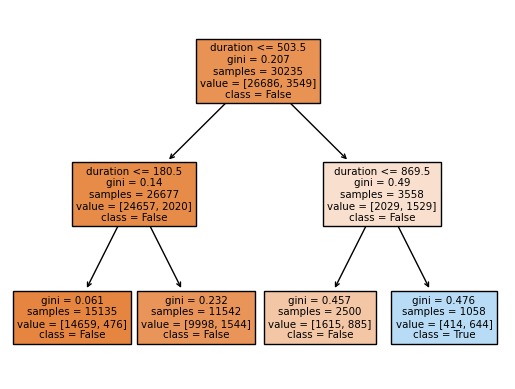

In [ ]:
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree

fig = plt.figure()
_ = plot_tree(clf, 
                   feature_names=['duration', 'campaign'],
                    class_names=['False', 'True'],
                   filled=True)

In [ ]:
clf.score(x_test,y_test)

0.8908782219478315

- **Conclusion:** The score obtained from our decision tree method is similar to Logistic Regression in last part. By look at the decision tree, you can see the gini value is relative big in 3 out of 4 leaf nodes. Therefore, we can say it is still hard to predict the outcome through this method. However, the problem can be data itself. If data is not linearly corelated, then we can't get a good estimation based on several methods. 

**2. Random Forest**

In [ ]:
X_tree = df_new.iloc[:,:-1]
X_tree.columns

Index(['young', 'middle_age', 'elderly', 'balance', 'admin.', 'blue-collar',
       'entrepreneur', 'housemaid', 'management', 'retired', 'self-employed',
       'services', 'student', 'technician', 'unemployed', 'divorced',
       'married', 'single', 'primary', 'secondary', 'tertiary', 'default',
       'housing', 'loan'],
      dtype='object')

In [ ]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(X_tree, df['y'],test_size=0.3, random_state=78)

from sklearn.ensemble import RandomForestClassifier
rfc=RandomForestClassifier(n_estimators=500,max_leaf_nodes=10)
rfc.fit(x_train, y_train)

rfc.score(x_test,y_test)

0.8850902917116839

- **Conclusion**: I tried many combination of **n_estimators= ,max_leaf_nodes= ** to maximize the final score, however, it seems always close to 0.88. (When I increase my leaf_nodes to a huge amount, the score will drop due to overlapping) I will say random forest can provide a brief prediction, but it is not accurate enough. 

### Part V. Data Relevence Visualization: Dimension Reduction
In this part, we aim to utilize Dimension Reduction plus to predict which type of customers are likely to sign up for a bank's term deposit. Given the multitude of variables in our dataset, we need to employ dimension reduction techniques to categorize them more efficiently. These methods fall under unsupervised learning. Here's a brief introduction to these terms:
- **Unsupervised learning**: discovers patterns in data without specific guidance
- **Dimension reduction**: simplifies complex data
    - **PCA** (Principal Component Analysis): simplifies complex datasets by condensing them into fewer dimensions while keeping the most important information
    - **TSNE** (t-distributed Stochastic Neighbor Embedding): a dimension reduction technique that focuses on visualizing high-dimensional data in a lower-dimensional space while preserving local structures.
    - **<PCA focuses on capturing overall variance in data to condense it, while t-SNE emphasizes revealing local patterns and clusters in a way that's easier to visualize.>**

In this part, we will try Dimension Reduction first:
- **PCA:**
We want to reduce all variable columns into 2 columns, so we set **n_components=2**.
**pca.fit_transform()** is necessary, since we want to get a data frame with only 2 columns.

In [ ]:
X_PCA = df_new.iloc[:,:-1]

In [ ]:
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_PCA)

In the below code, since the **df_new['y']** has unique index for each row, we need to erase those index and convert it to the normal way. Here, we use the method **.reset_index(drop=True)**:

In [ ]:
df_pca = pd.DataFrame(X_pca,columns=['pc1','pc2'])
df_pca_y = df_new['y'].reset_index(drop = True) #reference

df_pca = pd.concat([df_pca,df_pca_y],axis = 1)
df_pca

,pc1,pc2,y
0,788.972683,-0.711166,False
1,-1325.027359,0.133277,False
2,-1352.027360,0.734173,False
3,-1123.027316,-0.746432,False
4,-907.027340,-1.505725,False
...,...,...,...
43188,-529.027317,-0.479142,True
43189,374.972668,-0.309321,True
43190,4360.972664,0.531843,True
43191,-686.027346,0.759329,False


Now, let's visualize the above data frame using **altair**:

In [ ]:
alt.Chart(df_pca).mark_circle(size=60).encode(
    x = 'pc1',
    y = 'pc2',
    color = 'y:N',
    tooltip = ['y:N']
).interactive().properties(
    title = 'PCA of Dataset'
)

alt.Chart(...)

Since the PCA doesn't give a clear image of classification, we will try another method:
- **TSNE:**
TSNE will provide us a better image. But firstly, we need to import TSNE to our project, and convert our data into TSNE data.
**Notice**: TSNE takes a long time to deal with a large data, in order to save some time, we will use a group random samples from **df_new** to fit in TSNE model.

In [ ]:
TSNE_sample = df_new.sample(10000,random_state=123)
TSNE_X_sample = TSNE_sample.iloc[:,:-1]
TSNE_Y_sample = (TSNE_sample['y']).reset_index(drop=True)

In [ ]:
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2,random_state=110,n_jobs=-1) #use all available CPU cores
X_tsne = tsne.fit_transform(TSNE_X_sample)

/shared-libs/python3.9/py/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/shared-libs/python3.9/py/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


In [ ]:
df_tsne = pd.DataFrame(X_tsne,columns=['tsne1','tsne2'])
df_tsne['y'] = TSNE_Y_sample
df_tsne

,tsne1,tsne2,y
0,70.630997,36.882130,False
1,26.073503,-5.131013,False
2,54.076099,15.021196,False
3,13.031662,-16.288887,False
4,-53.456001,-2.219901,False
...,...,...,...
9995,-65.966759,-52.339767,False
9996,-39.448551,-54.611374,True
9997,-65.475075,-24.158939,False
9998,18.116796,-36.984108,False


In [ ]:
alt.Chart(df_tsne).mark_circle(size=60).encode(
    x = 'tsne1',
    y = 'tsne2',
    color = 'y:N',
    tooltip = ['y:N']
).interactive().properties(
    title = 'TSNE of Dataset'
)

alt.Chart(...)

In this case, TSNE also gives us a strange figue.

- Analysis: 
    - PCA might not generate a clear classification image when the data doesn't exhibit distinct linear relationships between variables or when the variance critical for classification isn't well-aligned with the principal components. Additionally, in scenarios where non-linear relationships exist within the data, PCA might not capture these complex structures effectively, impacting its ability to provide a clear classification image.
    - t-SNE might struggle to create a clear classification image when dealing with very high-dimensional data or datasets with noisy or sparse features. Additionally, if the clusters in the data are inherently overlapping or have complex, non-linear structures, t-SNE might not represent them accurately in a lower-dimensional space, leading to a less distinct classification image.

- Possible Solution:
    - Reduce the range of our input data size. This time, instead of using all features, I will reduce the data size (less columns/variables). Hope we can workout this time!

Let's choose our new data set and redo the above process with smaller samples:

In [ ]:
DR_column = ['duration', 'campaign','y']

In [ ]:
DR_data_new = (df.loc[:,DR_column]).sample(5000,random_state=999)
DR_X = DR_data_new.iloc[:,:-1]
DR_Y = DR_data_new['y'].reset_index(drop=True)

In [ ]:
New_x_tsne = tsne.fit_transform(DR_X)

/shared-libs/python3.9/py/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/shared-libs/python3.9/py/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


In [ ]:
df_New_tsne = pd.DataFrame(New_x_tsne,columns=['tsne1','tsne2'])
df_New_tsne['y'] = DR_Y
df_New_tsne

,tsne1,tsne2,y
0,-0.782646,6.951202,False
1,79.616730,10.005441,False
2,-49.484390,-53.164055,True
3,38.418545,-65.913544,False
4,-45.744884,37.791634,False
...,...,...,...
4995,3.745734,-30.745201,False
4996,-52.594669,-50.808937,False
4997,-3.334065,7.638218,False
4998,-19.823957,-2.482768,False


In [ ]:
alt.Chart(df_New_tsne).mark_circle(size=60).encode(
    x = 'tsne1',
    y = 'tsne2',
    color = 'y:N',
    tooltip = ['y:N']
).interactive().properties(
    title = 'TSNE of Dataset'
)

alt.Chart(...)

- **Conclusion**: Even with the smaller data and variables, the image still doesn't illustrate distinct areas for different types of output. Therefore, we can say the classification in the data are inherently overlapping or have complex, non-linear structures.

### Part VI. Clustering: K-Means Clustering
- **K-Means Clustering** is an unsupervised machine learning algorithm used for clustering or grouping similar data points together. It aims to partition a dataset into K clusters where each data point belongs to the cluster with the nearest mean (centroid)
- here, we want to use K-Means to do clients segmentation which finding natural groupings or patterns within data is crucial.
- Variables that we use this time (in **df**):
    - all numberical variables in **df**
    - ['age', 'duration', 'campaign', 'pdays', 'previous']


In [ ]:
df_K_x = df.loc[:,['age', 'duration', 'campaign', 'pdays', 'previous']]
df_K_y = df['y'].reset_index(drop=True)
# Use PCA
pca_y = pca.fit_transform(df_K_x)

df_KM = pd.DataFrame(pca_y,columns=['pca1','pca2'])
df_KM['y'] = df_K_y

#Use K-mean
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=2,random_state=0)
y_Km = kmeans.fit_predict(df_K_x)

df_KM['y_km'] = y_Km

# image (y)
c_y = alt.Chart(df_KM).mark_circle().encode(
    x = 'pca1',
    y = 'pca2',
    color = alt.Color('y:N',scale = alt.Scale(scheme='set1')),
).properties(
    title = 'PCA: Y (True/False)'
)
c_y

# image (K-m)
c_km = alt.Chart(df_KM).mark_circle().encode(
    x = 'pca1',
    y = 'pca2',
    color = alt.Color('y_km:N',scale = alt.Scale(scheme='set1')),
).properties(
    title = 'PCA: K-mean (1/0)'
)
c_km

alt.hconcat(c_y,c_km).properties(
    title = 'PCA: K-means Clustering vs. y Bool'
)

alt.HConcatChart(...)

Test the accuracy:
**Adjusted Rand Index (ARI)** (reference)
The Adjusted Rand Index is a function that measures the similarity of the two assignments, ignoring permutations and with chance normalization. It's a common way to compare the clustering result with the true labels.

In [ ]:
from sklearn import metrics
metrics.adjusted_rand_score(df_KM['y_km'],df_KM['y'])

0.2945078298429357

- **Conclusion**: Visually, the clusters produced by K-Means (image PCA:K-mean) appear distinct and well-separated, indicating clear boundaries between groups. However, when quantitatively assessing the similarity between the K-Means clusters and the true categories using the Adjusted Rand Index (ARI), the agreement between the two is relatively low (ARI of 0.295).
- The ARI score of 0.295 suggests a moderate level of agreement beyond random chance, indicating that the clustering produced by K-Means does share some similarity with the true categories but doesn't perfectly align with them.


### Extra: Hierarchical clustering: Agglomerative Clustering

Hierarchical clustering methods are versatile and adaptable, making them valuable for handling binary or categorical data.

- Agglomerative hierarchical clustering, for instance, starts with each data point as a single cluster and progressively merges similar clusters until a stopping criterion is met, creating a tree-like structure (dendrogram). 
- Divisive clustering, on the other hand, starts with all data points in a single cluster and recursively divides them into smaller clusters based on dissimilarity until individual points form separate clusters.
These methods use specific similarity measures suitable for categorical or binary data, such as the Hamming distance or other appropriate metrics for non-numeric variables. They're advantageous for such data types because they don't rely on assumptions related to distance metrics for continuous variables, making them well-suited for handling categorical features.


- Before we start this method, I extract the data frame which contains all binary / boolean columns:

In [ ]:
all_bool = df_new.drop(columns = 'balance').copy()
all_bool = all_bool.sample(10000,random_state = 1314)
bool_x = all_bool.iloc[:,:-1]

- Now, we can start using Agg_Clustering method, plotting it, and comparing it with K-means.

In [ ]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.datasets import make_blobs
import matplotlib.pyplot as plt
agg_cluster = AgglomerativeClustering(n_clusters=2, linkage='ward')  # Adjust linkage and n_clusters as needed
agg_cluster.fit(bool_x)

AgglomerativeClustering()

In [ ]:
# Use PCA
from sklearn.decomposition import PCA
pca = PCA(n_components=2,random_state=555)
pca_bool = pca.fit_transform(bool_x)
df_bool = pd.DataFrame(pca_bool,columns=['pca1','pca2'])
df_bool['y'] = all_bool['y'].reset_index(drop = True)
df_bool['y_agg'] = agg_cluster.labels_

In [ ]:
(df_bool['y']==df_bool['y_agg']).mean()

0.6989

In [ ]:
import altair as alt
alt.data_transformers.disable_max_rows() #reference 4
c_bool = alt.Chart(df_bool).mark_circle().encode(
    x = 'pca1',
    y = 'pca2',
    color = alt.Color('y_agg:N',scale = alt.Scale(scheme='set1')),
).properties(
    title = 'PCA: Agg'
)
c_bool

alt.Chart(...)

- **Conclusion**: Visually inspecting the scatter plots resulting from the agglomerative hierarchical clustering method reveals a noticeable separation between two outcome categories. However, when quantitatively assessing the similarity between the assigned agg_cluster_labels and the true binary labels (y), the accuracy yields approximately 0.7. Surprisingly, this accuracy, although not perfect, surpasses the performance obtained by the K-Means method. Therefore, while the agglomerative hierarchical clustering visually demonstrates a discernible separation, the relatively higher accuracy in aligning with the true binary labels signifies its improved performance compared to K-Means in this context.

## Summary
- In this project, I began by cleaning the data and then constructed a Logistic Regression model with many variables (include Dummy Variables). Training this model with the database enabled me to discern whether each variable positively or negatively influenced the outcome. Subsequently, I attempted various methods to visually classify the data, encompassing both supervised and unsupervised machine learning approaches. However, the final results were unsatisfactory due to an excessive number of categorical variables (transformed into numerous dummy variables). The abundance of variables resulted in many models being disrupted by irrelevant features, thereby neglecting the genuinely significant variables. Hence, in conducting data analysis, the alignment between data selection and methodology becomes pivotal for effective outcomes.
- Finally, addressing the primary question of this project—regarding whether customers opt for a bank's term deposit subscription—it becomes evident that customer characteristics play a predominant role. Yet, the bank's promotional efforts subtly influence their decisions. Crucial factors to emphasize include loan status, defaults, and similar aspects. If the bank intends to boost customer subscription inclination through campaign contacts, our recommended strategy lies in striking a balance between extended, more impactful personal interactions and minimizing the overall count of contacts. This balancing act is pivotal in optimizing the bank's approach to attract more subscriptions.


## References

Your code above should include references.  Here is some additional space for references.

* What is the source of your dataset(s)?
<font color='blue'>Moro,S., Rita,P., and Cortez,P.. (2012). Bank Marketing. UCI Machine Learning Repository. https://doi.org/10.24432/C5K306.

* List any other references that you found helpful.

<font color = 'blue'>1. https://www.geeksforgeeks.org/replace-the-column-contains-the-values-yes-and-no-with-true-and-false-in-python-pandas/ 
2.https://note.nkmk.me/en/python-pandas-dtype-select/
3.https://pandas.pydata.org/docs/reference/api/pandas.get_dummies.html
4.https://altair-viz.github.io/user_guide/large_datasets.html
5.https://pandas.pydata.org/docs/reference/api/pandas.Series.reset_index.html
6.https://scikit-learn.org/stable/modules/generated/sklearn.metrics.adjusted_rand_score.html
7.https://scikit-learn.org/stable/modules/generated/sklearn.cluster.AgglomerativeClustering.html


